<a href="https://colab.research.google.com/github/misbah4064/age_and_gender_detection/blob/master/age%26genderDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# Downloading pretrained data and unzipping it
!gdown https://drive.google.com/uc?id=1_aDScOvBeBLCn_iv0oxSO8X1ySQpSbIS
# https://drive.google.com/uc?id=1_aDScOvBeBLCn_iv0oxSO8X1ySQpSbIS
!unzip modelNweight.zip

Downloading...
From: https://drive.google.com/uc?id=1_aDScOvBeBLCn_iv0oxSO8X1ySQpSbIS
To: /content/modelNweight.zip
100% 86.2M/86.2M [00:02<00:00, 39.0MB/s]
Archive:  modelNweight.zip
   creating: modelNweight/
  inflating: modelNweight/age_deploy.prototxt  
  inflating: modelNweight/age_net.caffemodel  
  inflating: modelNweight/gender_deploy.prototxt  
  inflating: modelNweight/gender_net.caffemodel  
  inflating: modelNweight/opencv_face_detector.pbtxt  
  inflating: modelNweight/opencv_face_detector_uint8.pb  


In [3]:
# Import required modules
import cv2 as cv
import math
import time
from google.colab.patches import cv2_imshow
# import argparse

def getFaceBox(net, frame, conf_threshold=0.7):
    frameOpencvDnn = frame.copy()
    frameHeight = frameOpencvDnn.shape[0]
    frameWidth = frameOpencvDnn.shape[1]
    blob = cv.dnn.blobFromImage(frameOpencvDnn, 1.0, (300, 300), [104, 117, 123], True, False)

    net.setInput(blob)
    detections = net.forward()
    bboxes = []
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > conf_threshold:
            x1 = int(detections[0, 0, i, 3] * frameWidth)
            y1 = int(detections[0, 0, i, 4] * frameHeight)
            x2 = int(detections[0, 0, i, 5] * frameWidth)
            y2 = int(detections[0, 0, i, 6] * frameHeight)
            bboxes.append([x1, y1, x2, y2])
            cv.rectangle(frameOpencvDnn, (x1, y1), (x2, y2), (0, 255, 0), int(round(frameHeight/150)), 8)
    return frameOpencvDnn, bboxes

faceProto = "modelNweight/opencv_face_detector.pbtxt"
faceModel = "modelNweight/opencv_face_detector_uint8.pb"

ageProto = "modelNweight/age_deploy.prototxt"
ageModel = "modelNweight/age_net.caffemodel"

genderProto = "modelNweight/gender_deploy.prototxt"
genderModel = "modelNweight/gender_net.caffemodel"

MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746)
ageList = ['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
genderList = ['Male', 'Female']

# Load network
ageNet = cv.dnn.readNet(ageModel, ageProto)
genderNet = cv.dnn.readNet(genderModel, genderProto)
faceNet = cv.dnn.readNet(faceModel, faceProto)

padding = 20

def age_gender_detector(frame):
    # Read frame
    t = time.time()
    frameFace, bboxes = getFaceBox(faceNet, frame)
    for bbox in bboxes:
        # print(bbox)
        face = frame[max(0,bbox[1]-padding):min(bbox[3]+padding,frame.shape[0]-1),max(0,bbox[0]-padding):min(bbox[2]+padding, frame.shape[1]-1)]

        blob = cv.dnn.blobFromImage(face, 1.0, (227, 227), MODEL_MEAN_VALUES, swapRB=False)
        genderNet.setInput(blob)
        genderPreds = genderNet.forward()
        gender = genderList[genderPreds[0].argmax()]
        # print("Gender Output : {}".format(genderPreds))
        print("Gender : {}, conf = {:.3f}".format(gender, genderPreds[0].max()))

        ageNet.setInput(blob)
        agePreds = ageNet.forward()
        age = ageList[agePreds[0].argmax()]
        print("Age Output : {}".format(agePreds))
        print("Age : {}, conf = {:.3f}".format(age, agePreds[0].max()))

        label = "{},{}".format(gender, age)
        cv.putText(frameFace, label, (bbox[0], bbox[1]-10), cv.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 255), 2, cv.LINE_AA)
    return frameFace

Gender : Female, conf = 0.996
Age Output : [[9.9693477e-01 3.0298217e-03 2.9670879e-05 3.1039647e-07 3.5899245e-06
  9.5325868e-07 2.9291940e-07 5.5158699e-07]]
Age : (0-2), conf = 0.997


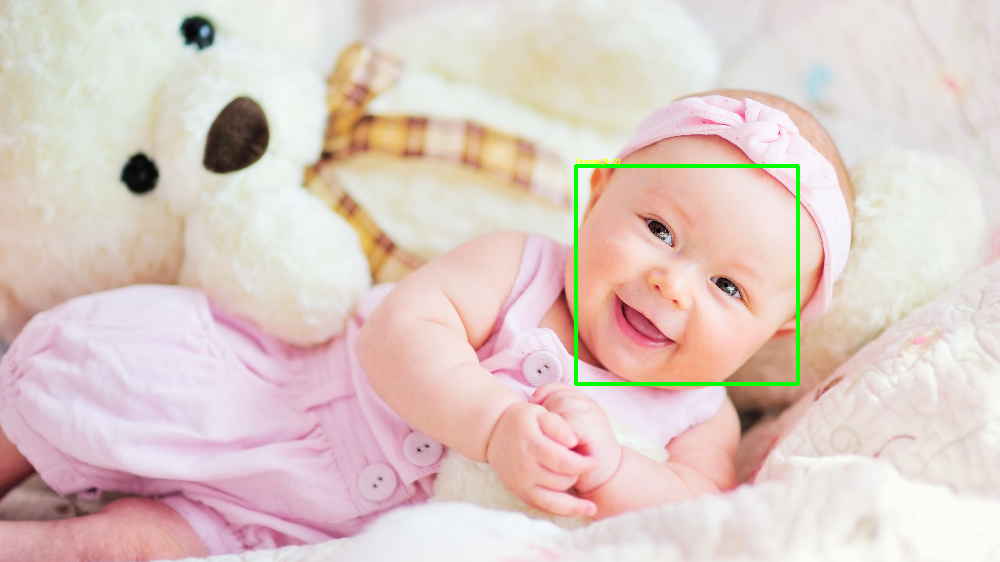

In [13]:
input = cv.imread("baby.jpg")
output = age_gender_detector(input)
cv2_imshow(output)

Gender : Male, conf = 0.999
Age Output : [[1.2969328e-03 9.9292505e-01 5.7606124e-03 2.2885574e-06 8.4061394e-06
  3.0428823e-06 3.0067663e-06 7.0843288e-07]]
Age : (4-6), conf = 0.993


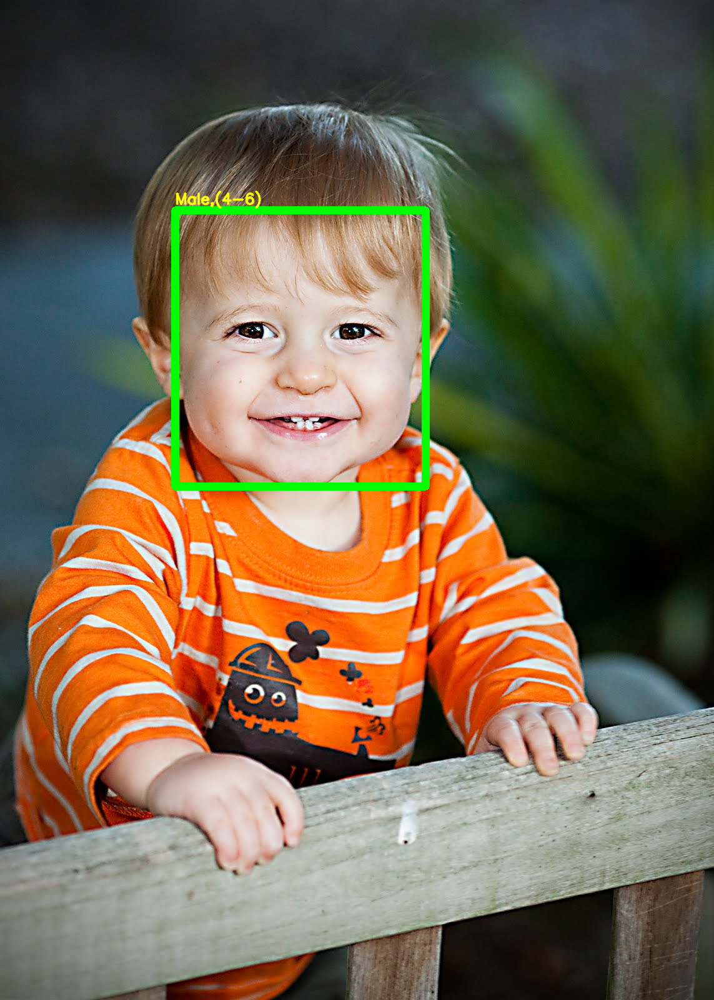

In [14]:
input = cv.imread("2year.jpeg")
output = age_gender_detector(input)
cv2_imshow(output)

Gender : Male, conf = 0.996
Age Output : [[3.8167245e-03 3.6026409e-03 1.9205047e-02 3.6687374e-03 9.5245701e-01
  1.2594447e-02 4.1021565e-03 5.5318803e-04]]
Age : (25-32), conf = 0.952
Gender : Male, conf = 0.994
Age Output : [[0.00156783 0.00057183 0.00143229 0.00937822 0.09220447 0.37006027
  0.15759407 0.36719102]]
Age : (38-43), conf = 0.370


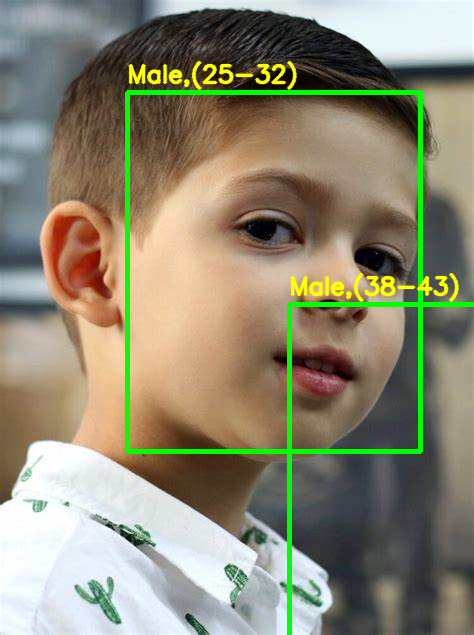

In [15]:
input = cv.imread("10year.jpeg")
output = age_gender_detector(input)
cv2_imshow(output)

Gender : Female, conf = 1.000
Age Output : [[3.9933654e-04 1.5989839e-03 9.6335206e-03 9.6084309e-01 2.0705625e-02
  5.9521184e-03 5.4693484e-04 3.2040596e-04]]
Age : (15-20), conf = 0.961


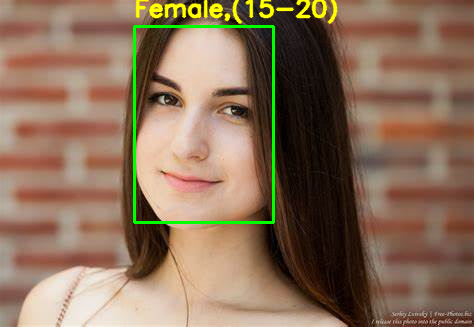

In [16]:
input = cv.imread("20year.jpeg")
output = age_gender_detector(input)
cv2_imshow(output)

Gender : Male, conf = 1.000
Age Output : [[8.4599560e-05 2.8287424e-03 3.9836654e-01 7.8674136e-03 5.8919829e-01
  1.3369883e-03 2.7226910e-04 4.5180052e-05]]
Age : (25-32), conf = 0.589


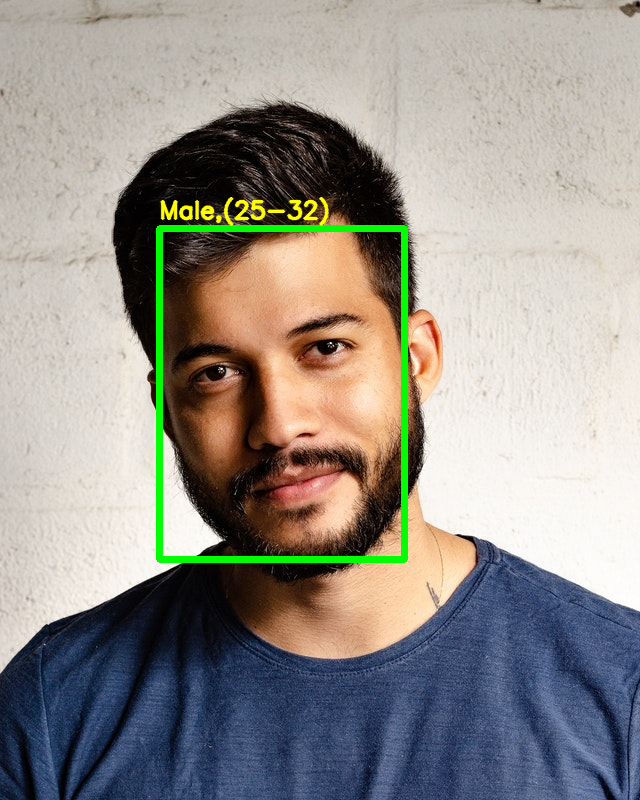

In [17]:
input = cv.imread("image.jpg")
output = age_gender_detector(input)
cv2_imshow(output)

Gender : Male, conf = 1.000
Age Output : [[7.0539335e-07 3.7358157e-05 2.0373633e-02 1.6500570e-03 9.7762191e-01
  3.0095936e-04 6.1849260e-06 9.2616729e-06]]
Age : (25-32), conf = 0.978


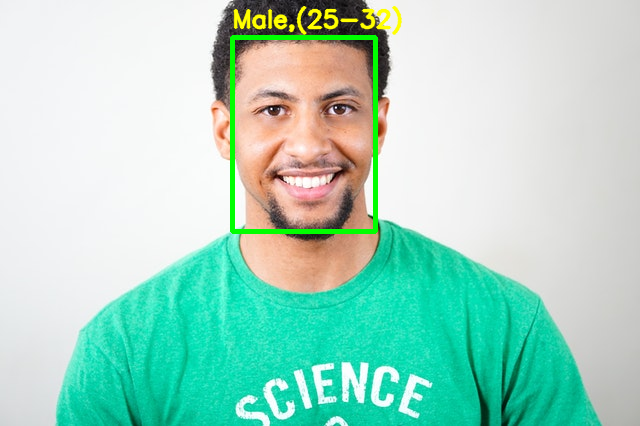

In [18]:
input = cv.imread("image1.jpg")
output = age_gender_detector(input)
cv2_imshow(output)

Gender : Female, conf = 0.766
Age Output : [[1.8572211e-05 1.7103013e-05 3.1205596e-02 1.3258841e-03 9.5220178e-01
  1.4848399e-02 2.3445356e-04 1.4826156e-04]]
Age : (25-32), conf = 0.952
Gender : Female, conf = 0.976
Age Output : [[5.31866495e-03 2.48792003e-05 6.98229007e-04 1.18692704e-04
  3.02114757e-03 5.08375704e-01 7.81714823e-03 4.74625528e-01]]
Age : (38-43), conf = 0.508


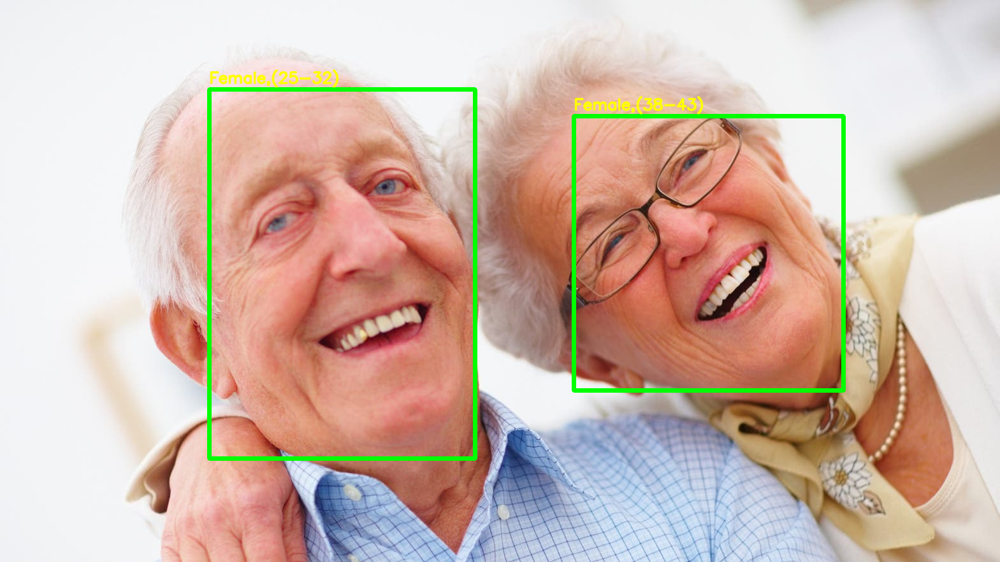

In [20]:
input = cv.imread("old.jpeg")
output = age_gender_detector(input)
cv2_imshow(output)